# Capstone Project - The Battle of the Boroughs 
### Applied Data Science Capstone by IBM

# Table of Contents
- Introduction and Business Problem
- Data  
- Outputs
- Methodology
- Results
- Conclusion

# Introduction and Business Problem

2020 has deprived the world of many things, including the UK's most popular and time-honoured social venue: the pub. In an effort to achieve some escapism from the shackles of 2020, this report will explore the best boroughs of London to open a new pub. The following factors will be conisdered in this report to help determine the most suitable boroughs for a new pub:

- **Density of pubs in area** - the ideal pub location is one that already contains many other pubs. If an area can successfully sustain a high density of pubs, then it is likely that further pubs will be succussful. After all, can you ever have too many pubs?
- **Age of people in area** - a younger population is generally more likely to frequent and sustain a new pub.
- **Population density** - more people mean more potential customers.
- **Rental costs** - lower rental costs mean higher potential profit. 
- **Household income** - higher income individuals are more likely to become patrons of a local pub.
- **Business survival rate** - high business survival rate indicates that new businesses are more likely to be successful.

Some of the factors outlined above could be considered inversely to what has been stated. For instance, it could be argued that an area with a high density of pubs should be avoided in an effort to avoid competition. However, for simplicity, this report will only consider the factors as outlined above.  

A number of visualisations and statisitical tools will be used to analyse the best location for a new pub. 

# Data 

The following data sources have been used:

- Age, income and business survival rates - London Datastore csv https://data.london.gov.uk/download/london-borough-profiles/c1693b82-68b1-44ee-beb2-3decf17dc1f8/london-borough-profiles.csv
- List of all London pubs - London Datastore csv https://data.london.gov.uk/download/cultural-infrastructure-map/7e6b0f36-da01-4029-99d7-640d89c4a0a4/Pubs.csv and https://www.getthedata.com/downloads/open_pubs.csv.zip
- Rental costs for London - London Datastore csv xls https://data.london.gov.uk/download/average-private-rents-borough/73b9fb07-b5bb-4a53-88b7-c17269879a08/voa-average-rent-borough.xls
- List of venues for each Borough - FourSquare API  https://foursquare.com/
- Borough centre point coordinates - Wikipedia  https://en.wikipedia.org/wiki/List_of_London_boroughs
- London borough boundary data https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london 

The outputs of the report will be:

- Heat map of boroughs displaying the factors outlined above
- Map with K clusters of areas by types venues
- Wordcloud with London pub names


# Import Libraries and Setup Notebook

In [203]:
# Library for data analysis
import pandas as pd

# Library for handling data in vectorised manner
import numpy as np

# Handling json files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Import matplotlib library and set dark mode
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
plt.style.use('dark_background')

# import K means clusterin
from sklearn.cluster import KMeans

# Library for converting addresses into coordinates
!pip install geopy

# Libary for map plotting / rendering
!pip install folium
import folium
# Utility module to deal with colour maps 
import branca.colormap as bm

# convert an address into latitude and longitude values
from geopy.geocoders import Nominatim 

# for xml & html scaping 
from bs4 import BeautifulSoup

# For HTTP requets 
import requests

#Install all packages needed for geopandas 
!pip install wheel
!pip install pipwin
!pipwin install numpy
!pipwin install pandas
!pipwin install shapely
!pipwin install gdal
!pipwin install fiona
!pipwin install pyproj
!pipwin install six
!pipwin install rtree
!pipwin install geopandas
!pip install descartes
import geopandas as gpd

# Install visualiser for Kmeans evaluation method (elbow method). 
!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer

Package `numpy` found in cache
https://download.lfd.uci.edu/pythonlibs/z4tqcw5k/numpy-1.19.4+vanilla-cp37-cp37m-win_amd64.whl
numpy-1.19.4+vanilla-cp37-cp37m-win_amd64.whl
[*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 4.6 MB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 8 kB / 4.6 MB @ 8 kB/s [------------------] [0.2%, 0s left]   [*] 8 kB / 4.6 MB @ 7 kB/s [------------------] [0.2%, 0s left]   [*] 40 kB / 4.6 MB @ 33 kB/s [------------------

Traceback (most recent call last):
  File "c:\users\richard.dudbridge\anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "c:\users\richard.dudbridge\anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\richard.dudbridge\Anaconda3\Scripts\pipwin.exe\__main__.py", line 7, in <module>
  File "c:\users\richard.dudbridge\anaconda3\lib\site-packages\pipwin\command.py", line 98, in main
    cache.install(package)
  File "c:\users\richard.dudbridge\anaconda3\lib\site-packages\pipwin\pipwin.py", line 300, in install
    wheel_file = self.download(requirement)
  File "c:\users\richard.dudbridge\anaconda3\lib\site-packages\pipwin\pipwin.py", line 294, in download
    return self._download(requirement, dest)
  File "c:\users\richard.dudbridge\anaconda3\lib\site-packages\pipwin\pipwin.py", line 290, in _download
    obj.start()
  File "c:\users\richard.dudbridge\anaconda3\lib\site-packages\pySmartDL\pySmartDL.py", line 2

Package `geopandas` found in cache
https://download.lfd.uci.edu/pythonlibs/z4tqcw5k/geopandas-0.8.1-py3-none-any.whl
geopandas-0.8.1-py3-none-any.whl
[*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 0 bytes / 940 kB @ 0 bytes/s [------------------] [0.0%, 0s left]   [*] 8 kB / 940 kB @ 8 kB/s [------------------] [0.9%, 0s left]   [*] 8 kB / 940 kB @ 7 kB/s [------------------] [0.9%, 0s left]   [*] 40 kB / 940 kB @ 33 kB/s [------------------] [4.3%, 0s left]   [*

In [204]:
# Change notebook to dark mode
from jupyterthemes import get_themes
from jupyterthemes.stylefx import set_nb_theme
set_nb_theme('monokai')

In [205]:
# Increase width of notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

# Get London Data

This section will cover retrieving data for: London profile, London centre coordindates, London pub density and London rental costs


## London Profile Data by Borough 

This section covers creating a data frame of London profile data by borough.

In [206]:
# Load London profile df
df_lon_profile = pd.read_csv('https://data.london.gov.uk/download/london-borough-profiles/c1693b82-68b1-44ee-beb2-3decf17dc1f8/london-borough-profiles.csv', encoding= 'unicode_escape',header=0)

# Filter columns of interest
df_lon_profile = df_lon_profile[['Area_name',
'Inland_Area_(Hectares)',
'Population_density_(per_hectare)_2017',
'Proportion_of_population_of_working-age,_2015',
'Modelled_Household_median_income_estimates_2012/13',
'Two-year_business_survival_rates_(started_in_2013)']]

# Simplify column names
df_lon_profile = df_lon_profile.rename(index=str, columns = { 'Inland_Area_(Hectares)':'Inland_Area_(Hectares)',
                                            'Population_density_(per_hectare)_2017':'Population_density',
                                            'Proportion_of_population_of_working-age,_2015':'Working_age %',
                                            'Modelled_Household_median_income_estimates_2012/13':'Median_income',
                                            'Two-year_business_survival_rates_(started_in_2013)':'Business_survival_rate',
                                            'Area_name':'Borough'                                           
                                            })
df_lon_profile.head()

,Borough,Inland_Area_(Hectares),Population_density,Working_age %,Median_income,Business_survival_rate
0,City of London,290,30.3,73.1,"£63,620",64.3
1,Barking and Dagenham,"3,611",57.9,63.1,"£29,420",73.0
2,Barnet,"8,675",44.9,64.9,"£40,530",73.8
3,Bexley,"6,058",40.3,62.9,"£36,990",73.5
4,Brent,"4,323",76.8,67.8,"£32,140",74.4


## Rental Costs by Borough

This section covers retrtiving rental costs from data.london.gov.uk. Commercial rental data is not freely available so private rental cost is used as an estimate

In [207]:
# Read excel file
df_rental = pd.read_excel('https://data.london.gov.uk/download/average-private-rents-borough/73b9fb07-b5bb-4a53-88b7-c17269879a08/voa-average-rent-borough.xls', sheet_name = 'Summary', header = None)

# Drop non data rows 
df_rental = df_rental.iloc[4:]

# Remove unwanted columns
df_rental.drop(df_rental.iloc[:, 99:110], inplace = True, axis = 1)
df_rental.drop(df_rental.iloc[:, 2:98], inplace = True, axis = 1) 
df_rental.drop(df_rental.iloc[:, 0:1], inplace = True, axis = 1) 

# Reset index and add columns. Average rental cost is across all categories (from room to 4 bed house) in 2019
df_rental.reset_index(drop = True, inplace = True)
df_rental.columns = ['Borough', 'Average Rental Cost (£)']

df_rental.head()

,Borough,Average Rental Cost (£)
0,City of London,2377
1,Barking and Dagenham,1192
2,Barnet,1548
3,Bexley,1084
4,Brent,1578


##  Pub Density by Borough

This section covers calculating pub density from data.london.gov.uk

In [266]:
# The FourSquare API is limited to 100 calls hence a new data source (https://data.london.gov.uk/) will be used to accurately analyse pub data

# Read csv, filter for boroughs, count number of pubs and rename borough names to ensure they match of the dfs
London_pub_df = pd.read_csv('https://data.london.gov.uk/download/cultural-infrastructure-map/7e6b0f36-da01-4029-99d7-640d89c4a0a4/Pubs.csv')
London_pub_df = London_pub_df.filter(['borough_name'])
London_pub_df = London_pub_df['borough_name'].value_counts().reset_index()
London_pub_df = London_pub_df.rename(columns={"index": "Borough", "borough_name": "Count of Pubs"})
London_pub_df.at[0,'Borough'] = 'Westminster'      
London_pub_df.at[3,'Borough'] = 'City of London' 

# Filter hecatare column from London profile data
Hectare_df = df_lon_profile[['Borough', 'Inland_Area_(Hectares)']]

# Simplify column names
Hectare_df = Hectare_df.rename(index=str, columns = {'Area_name':'Borough'})

# Merge London_pub_df with Hectare_df 
London_pub_df = London_pub_df.join(Hectare_df.set_index('Borough'), on = 'Borough')

# Remove commas from hectare column and change data type to numeric
London_pub_df['Inland_Area_(Hectares)'] = London_pub_df['Inland_Area_(Hectares)'].str.replace(',', '')
London_pub_df = London_pub_df.astype({'Inland_Area_(Hectares)' : 'int32'})

# Calculate number of pubs per square km (100 hectares in every square km)
pub_dens = (London_pub_df['Count of Pubs'] / London_pub_df['Inland_Area_(Hectares)'])*100

# Convert to df and rename colum
pub_dens = pd.DataFrame(pub_dens)
pub_dens.columns = ["Pubs per square km"]

# Join London_pub_df with hectare df
London_pub_df = London_pub_df.join(pub_dens)

# City of London value reduced to the next closest value to allow for clearer distinction between Boroough on Choropleth Maps
London_pub_df.loc[3, 'Pubs per square km'] = 21.265705

# Drop Inland Hectares column as no longer needed
London_pub_df = London_pub_df.drop(['Inland_Area_(Hectares)'], axis =1)

London_pub_df.head()

,Borough,Count of Pubs,Pubs per square km
0,Westminster,457,21.265705
1,Camden,270,12.391005
2,Islington,243,16.352624
3,City of London,215,21.265705
4,Southwark,208,7.207207


## Create London Choropleth Maps

This section shows Choropleth Maps to explore varables from the London data which has been extracted in the previous sections

In [267]:
# Boundary map of London downladed and filepath set (stored on local computer)
fp = r'C:\Users\richard.dudbridge\Documents\Python Scripts\statistical-gis-boundaries-london\MapInfo'

# Create map object 
map_df = gpd.read_file(fp)

# Rename column names
map_df = map_df.rename(index=str, columns = {'Name':'Borough',})

# Create new master df starting with London Profile df
df_for_map = df_lon_profile

# Merge df for map and df of London pubs
df_for_map = df_for_map.join(London_pub_df.set_index('Borough'), on = 'Borough')

# Merge df for map and df of London rental costs
df_for_map = df_for_map.join(df_rental.set_index('Borough'), on = 'Borough')

# Drop unused columns
df_for_map = df_for_map.drop(['Inland_Area_(Hectares)', 'Count of Pubs'], axis = 1)

# Join geodf with master df_for_map (using index of the name of borough)
merged = map_df.set_index('Borough').join(df_for_map.set_index('Borough'))

# Drop unused columns
merged = merged.drop(['Plan_Subregion_2009','Plan_Subregion_2006'], axis = 1)

merged.head()


C:\Users\richard.dudbridge\Anaconda3\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


,GSS_Code,Hectares,Non_Inland_Area,ONS_Inner,geometry,Population_density,Working_age %,Median_income,Business_survival_rate,Pubs per square km,Average Rental Cost (£)
Borough,,,,,,,,,,,
Kingston upon Thames,E09000021,3726.117,0.000,F,"POLYGON ((516401.600 160201.800, 516407.300 16...",47.1,67.2,"£43,940",76.8,1.986044,1396
Croydon,E09000008,8649.441,0.000,F,"POLYGON ((535009.200 159504.700, 535005.500 15...",44.7,64.9,"£37,000",75.3,1.271676,1112
Bromley,E09000006,15013.487,0.000,F,"POLYGON ((540373.600 157530.400, 540361.200 15...",21.8,62.6,"£43,060",78.6,0.719377,1318
Hounslow,E09000018,5658.541,60.755,F,"POLYGON ((521975.800 178100.000, 521973.000 17...",49,67.6,"£35,330",76.2,1.661308,1410
Ealing,E09000009,5554.428,0.000,F,"POLYGON ((510253.500 182881.600, 510249.900 18...",63.3,66.8,"£36,070",75.8,1.890529,1484


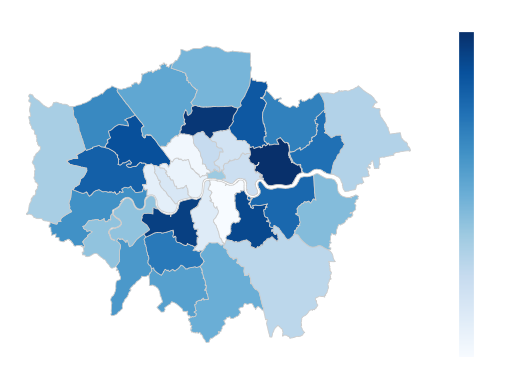

In [254]:
# Set choropleth range
vmin, vmax = 20, 160

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Population Density', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('People per Hectare', rotation = 90)

# Plot map
merged.plot(column='Population_density', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

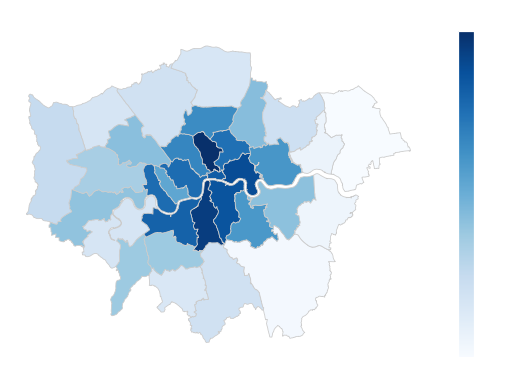

In [259]:
# Set choropleth range
vmin, vmax = 0, 100

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Percentage of People at Working Age', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('% of People at Working Age', rotation = 90)

# Plot map
merged.plot(column='Working_age %', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

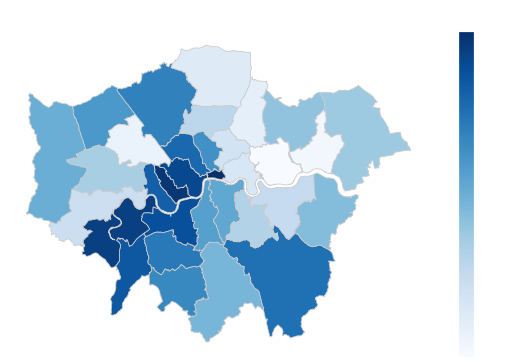

In [257]:
# Set choropleth range
vmin, vmax = 28000, 64000

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Median Household Income', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('Median Household Income (£)', rotation = 90)

# Plot map
merged.plot(column='Median_income' , cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

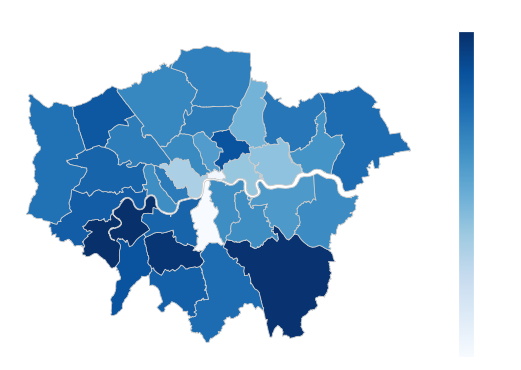

In [260]:
# Set choropleth range
vmin, vmax = 60, 80

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Business Surival Rate', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('% of Business Still Open after 2 Years', rotation = 90)

# Plot map
merged.plot(column='Business_survival_rate', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

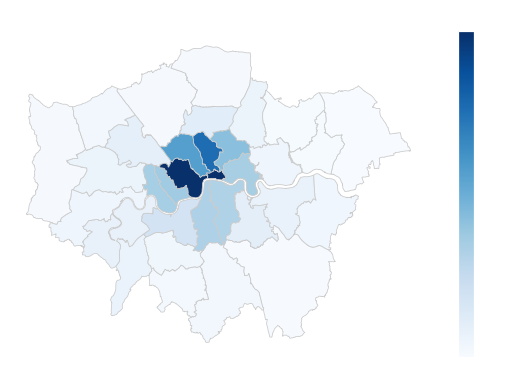

In [268]:
# Set choropleth range
vmin, vmax = 0, 21

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Pub Density', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('Number of pubs per km', rotation = 90)

# Plot map
merged.plot(column='Pubs per square km', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

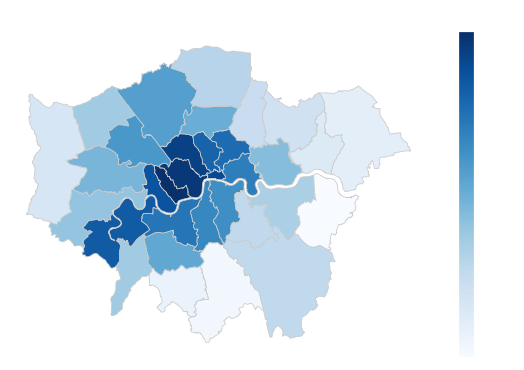

In [273]:
# Set choropleth range
vmin, vmax = 1000, 3000

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Rental Costs', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
cbar.set_label('Average private monthly rental cost for a unit (£)', rotation = 90)

# Plot map
merged.plot(column='Average Rental Cost (£)', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

## Decision Matrix

The heat maps in the previous section show a mixed picture of which borough is best. The next section will cover the creation of a decision matrix which will weight all of the variiables and give a single score to each borough of London.

In [216]:
# Create new df for decision matrix
decision_matrix_df = df_for_map.head(33)

# City of London value restored to original value (the next closest value was used to allow for clearer distinction between Boroough on Choropleth Maps)
decision_matrix_df.iloc[0, 5] = 74.137931

# Separate df for just borough values
decision_matrix_df_borough = decision_matrix_df['Borough']

# Drop non-numeric columns
decision_matrix_df = decision_matrix_df.drop(['Borough'], axis = 1)

# Drop non numeric symbols
decision_matrix_df['Median_income'] = decision_matrix_df['Median_income'].str.replace('£','')
decision_matrix_df['Median_income'] = decision_matrix_df['Median_income'].str.replace(',','')

# Convert data types to numeric
decision_matrix_df['Median_income'] = decision_matrix_df['Median_income'].astype('float')
decision_matrix_df['Population_density'] = decision_matrix_df['Population_density'].astype('float')
decision_matrix_df['Average Rental Cost (£)'] = decision_matrix_df['Average Rental Cost (£)'].astype('float')

# Normalize data
normalized_decision_matrix_df = (decision_matrix_df-decision_matrix_df.min())/(decision_matrix_df.max()-decision_matrix_df.min())

# Add borough column back in and move to the first column
normalized_decision_matrix_df['Borough'] = decision_matrix_df_borough
cols = normalized_decision_matrix_df.columns.tolist()
cols = cols[-1:] + cols[:-1]
normalized_decision_matrix_df = normalized_decision_matrix_df[cols] 

# Inverse rental column as high rent is bad
normalized_decision_matrix_df['Average Rental Cost (£)'] = 1 - normalized_decision_matrix_df['Average Rental Cost (£)']

# Add total column 
normalized_decision_matrix_df['Pub Score Total'] = normalized_decision_matrix_df.sum(axis=1)

# Weight columns by importance 
Population_density_weighting = 1
Working_age_weighting = 1
Median_income_weighting = 2
Business_survival_rate_weighting = 4
Pub_density_weighting = 0.5
Average_rental_cost_weighting = 2
normalized_decision_matrix_df['Population_density'] = normalized_decision_matrix_df['Population_density'].multiply(Population_density_weighting)
normalized_decision_matrix_df['Working_age %'] = normalized_decision_matrix_df['Working_age %'].multiply(Working_age_weighting)
normalized_decision_matrix_df['Median_income'] = normalized_decision_matrix_df['Median_income'].multiply(Median_income_weighting)
normalized_decision_matrix_df['Business_survival_rate'] = normalized_decision_matrix_df['Business_survival_rate'].multiply(Business_survival_rate_weighting)
normalized_decision_matrix_df['Pubs per square km'] = normalized_decision_matrix_df['Pubs per square km'].multiply(Pub_density_weighting)
normalized_decision_matrix_df['Average Rental Cost (£)'] = normalized_decision_matrix_df['Average Rental Cost (£)'].multiply(Average_rental_cost_weighting)

# Sort by total columns
normalized_decision_matrix_df = normalized_decision_matrix_df.sort_values(by=['Pub Score Total'], ascending = False)

# Normalize score for 0-10
normalized_decision_matrix_df['Pub Score Total'] = (normalized_decision_matrix_df['Pub Score Total'] / normalized_decision_matrix_df['Pub Score Total'].max()).multiply(10)

normalized_decision_matrix_df['Pub Score Total'] = normalized_decision_matrix_df['Pub Score Total'].round(2)

normalized_decision_matrix_df.head(33)

C:\Users\richard.dudbridge\Anaconda3\lib\site-packages\pandas\core\indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


,Borough,Population_density,Working_age %,Median_income,Business_survival_rate,Pubs per square km,Average Rental Cost (£),Pub Score Total
18,Islington,1.000000,1.000000,0.632032,2.320000,0.106935,1.236347,10.00
11,Hackney,0.913303,0.753846,0.365098,3.466667,0.059260,1.293785,9.34
31,Wandsworth,0.537369,0.807692,1.073479,3.200000,0.025880,1.299435,9.08
0,City of London,0.063528,0.830769,2.000000,0.133333,0.500000,0.782486,8.90
29,Tower Hamlets,0.985800,0.892308,0.353042,1.573333,0.048661,1.351224,8.64
27,Southwark,0.650972,0.861538,0.477612,2.560000,0.044726,1.442561,8.59
12,Hammersmith and Fulham,0.681614,0.769231,0.863375,2.560000,0.049206,1.071563,8.47
6,Camden,0.668909,0.669231,0.859357,2.613333,0.079987,0.735405,7.91
19,Kensington and Chelsea,0.816891,0.538462,1.540758,2.853333,0.051264,0.000000,7.89
13,Haringey,0.538864,0.646154,0.381171,2.826667,0.015464,1.596045,7.81


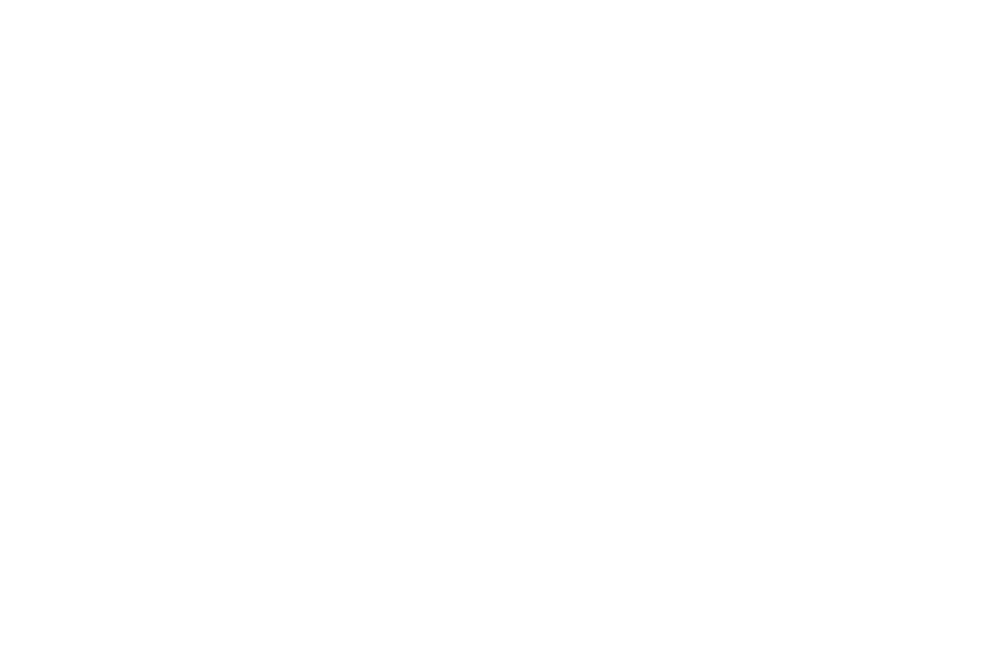

In [303]:
plt.figure(figsize=(25, 12))
plt.bar(normalized_decision_matrix_df['Borough'], normalized_decision_matrix_df['Pub Score Total'], color = 'white')
plt.title('New Pub Score for London Boroughs', fontsize = 25)
plt.xticks(fontsize = 20, rotation = 90)
plt.yticks(fontsize = 20)
plt.xlabel('Borough', fontsize = 25)
plt.ylabel('Pub Score Total', fontsize = 25)
plt.grid(False)
plt.box(on=None) 
plt.show()

## Interactive Choropleth of London Best Pub Borough

This section creates an interactive Choropleth of London which is the main output of this project. This map will allow you to clearly see which Boroughs are most suitable for new pubs. You will be able to hover over each borough to see indiviidual boroughs and borough scores

In [217]:
#Get centre points for London
address = 'London'

#Nominatim allows addresses to be converted into coordinates
geolocator = Nominatim(user_agent="London_explorer") 
location = geolocator.geocode(address) 
latitude = location.latitude 
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


In [218]:
# Filter decision matrix to just score and borough
normalized_decision_matrix_score_df = normalized_decision_matrix_df.filter(["Borough", "Pub Score Total"])

# Update master df_for_map with df of pub scores
df_for_map = df_for_map.join(normalized_decision_matrix_score_df.set_index('Borough'), on = 'Borough')

# Update merged df again. Join geodf with master df_for_map (using index of the name of borough).
merged = map_df.set_index('Borough').join(df_for_map.set_index('Borough'))

# Reset index as numbers rather than boroughs. 
merged.reset_index(inplace = True)

# Create map. Use London latitude and longitude which was defined earlier. Tile added using TileLayer method to allow for the hiding of of the tile set from LayerControl. 
mymap = folium.Map(location=[latitude, longitude], zoom_start=10,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap)

# Scale for Choropleth set as a list
myscale = (merged['Pub Score Total'].quantile((0,0.1,0.5,0.75,0.9,0.98,1))).tolist()
# Add data to create static map
mymap.choropleth(
 geo_data=merged, # Pass in geo data
 name='Choropleth', # Specify map type 
 data=merged, #  Pass in map data
 columns=['Borough','Pub Score Total'], # Specify columns from data
 key_on="feature.properties.Borough", # Specify that the map's key is on 'Borough' 
 fill_color='Blues',
 threshold_scale=myscale,
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='Potential New Pub Score Out of 10',
 smooth_factor=0
)

# Create funcitons for style and highlighting
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
# Add highlight tooltip to map
LON = folium.features.GeoJson(
    merged,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Borough','Pub Score Total'],
        aliases=['Borough: ','Pub Score Total: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
# Specify keep in front to ensure LON interactive map is always at the front
mymap.add_child(LON)
mymap.keep_in_front(LON)
folium.LayerControl().add_to(mymap)

mymap

C:\Users\richard.dudbridge\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


# K-Means Cluster of London Boroughs by Venue Types

This section uses KMeans Cluster Machine Learning to cluster the boroughs of London together by similar venues. This information will be used to further validate the best borough to open a pub in London

## Create Normalised Data Frame of London Venues by Borough

In [219]:
# Foursquare credentials
CLIENT_ID = 'KEKMZBMTT10CAZIGVA0JJF30SZUMOCPOHLHCAUO1XXAARRY0' # your Foursquare ID
CLIENT_SECRET = 'Z1T1BZI0FZY41H0OHSA3HWVJ4YLO2Z1R1PLGIVPOSJKMFWUQ' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

In [220]:
# Get new coordinates because coordinates scraped from wiki are in incorrect format 
London_Borough_Coordinates = pd.read_csv("https://www.grasshopper3d.com/forum/attachment/download?id=2985220%3AUploadedFile%3A1192104")

# Keep and rename useful columns
London_Borough_Coordinates = London_Borough_Coordinates[['Area', 'Latitude', 'Longitude']]
London_Borough_Coordinates = London_Borough_Coordinates.rename(columns = {'Area':'Borough'})

In [221]:
# Function to grab venues for each borough in London
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

# Creates a new df with a list of all venues in London
London_venues = getNearbyVenues(names=London_Borough_Coordinates['Borough'],
                                   latitudes=London_Borough_Coordinates['Latitude'],
                                   longitudes=London_Borough_Coordinates['Longitude'])

London_venues.head()

City of London
Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,City of London,51.5155,-0.0922,Hawksmoor Guildhall,51.515498,-0.090849,Steakhouse
1,City of London,51.5155,-0.0922,Goodman Steak House Restaurant,51.514398,-0.090745,Steakhouse
2,City of London,51.5155,-0.0922,The Ned Hotel,51.513755,-0.090067,Hotel
3,City of London,51.5155,-0.0922,Daunt Books,51.513982,-0.092995,Bookstore
4,City of London,51.5155,-0.0922,The Merchant House,51.513264,-0.093039,Cocktail Bar


In [222]:
# one hot encoding to set data frame up for K-Means Algorithm 
London_onehot = pd.get_dummies(London_venues[['Venue Category']], prefix="", prefix_sep="")

# add Borough column back to dataframe
London_onehot['Borough'] = London_venues['Borough'] 

# move Borough column to the first column
fixed_columns = [London_onehot.columns[-1]] + list(London_onehot.columns[:-1])
London_onehot = London_onehot[fixed_columns]

London_grouped = London_onehot.groupby('Borough').mean().reset_index()
London_grouped.head()

,Borough,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,...,Used Bookstore,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Winery,Women's Store,Yoga Studio
0,Barking and Dagenham,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
1,Barnet,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
2,Bexley,0.0,0.0,0.0,0.0,0.037037,0.0,0.0,0.0,0.0,...,0.0,0.0,0.037037,0.0,0.037037,0.0,0.0,0.0,0.0,0.0
3,Brent,0.0,0.0,0.0,0.0,0.013889,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
4,Bromley,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


## Cluster Boroughs by Venues 

Now that a normalised dataframe has been created with top venues by borough, the next step is to use K-Means clustering to cluster the boroughs together with each other by venue type 

In [223]:
# Set k means cluster size - value is chosen based on the evaluation method below. Althogh the recommended value for K is 10, this is not a practical split for choose the best restaurant areas so K = 7 is used instead
kclusters = 9

# Drop borugh column from London_grouped df
London_grouped_clustering = London_grouped.drop('Borough',1)

# Run k means cluster on London grouped
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(London_grouped_clustering)

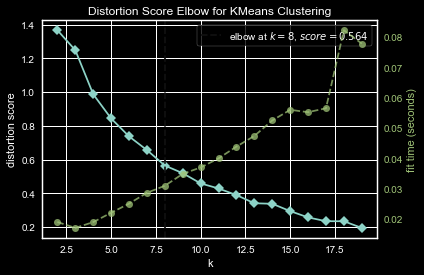

In [224]:
# Initiate the clustering model and visualizer. KElbowVisualizer plots a line graph which shows that increasing K centroids decreases distortion (sum of squares). This is expected behaviour as the more centre points there are, the closer each data point is to a centre point. The visualiser also shows that increassing centre points increases algorithm time. The ideal K point is the cross section between time of algorithm and disortion.
# Although 10 is given as the optimal K value, it isn't practical to have 10 clusters as the similarities within clusters become less apparant with greater numbers of K
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,20))

# Fit the data to the visualizer
visualizer.fit(London_grouped_clustering)    
# Finalize and render the figure
visualizer.show()        

In [225]:
#Prints top 5 venues for each Borough
num_top_venues = 5

for hood in London_grouped['Borough']:
    print("----"+hood+"----") 
    temp = London_grouped[London_grouped['Borough'] == hood].T.reset_index() 
    temp.columns = ['venue','freq'] 
    temp = temp.iloc[1:] 
    temp['freq'] = temp['freq'].astype(float) 
    temp = temp.round({'freq': 2}) 
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues)) 
    print('\n')

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)

    return row_categories_sorted.index.values[0:num_top_venues]

----Barking and Dagenham----
                 venue  freq
0                 Pool  0.14
1                 Park  0.14
2          Bus Station  0.14
3          Supermarket  0.14
4  Martial Arts School  0.14


----Barnet----
                venue  freq
0                Café  0.50
1            Bus Stop  0.25
2    Business Service  0.25
3  African Restaurant  0.00
4       Movie Theater  0.00


----Bexley----
                  venue  freq
0                   Pub  0.11
1        Clothing Store  0.11
2              Pharmacy  0.07
3           Coffee Shop  0.07
4  Fast Food Restaurant  0.07


----Brent----
                 venue  freq
0          Coffee Shop  0.10
1                Hotel  0.08
2                  Bar  0.07
3  Sporting Goods Shop  0.07
4       Clothing Store  0.06


----Bromley----
            venue  freq
0  Clothing Store  0.15
1     Coffee Shop  0.12
2    Burger Joint  0.05
3     Pizza Place  0.05
4             Bar  0.05


----Camden----
         venue  freq
0  Coffee Shop  0.12
1   

In [226]:
# Create a list of the top 10 venues for each Borough

num_top_venues = 10

# Suffix for columns
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Borough']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Borough_venues_sorted = pd.DataFrame(columns=columns)
Borough_venues_sorted['Borough'] = London_grouped['Borough']

# Add most common venues to new dataframe
for ind in np.arange(London_grouped.shape[0]):
    Borough_venues_sorted.iloc[ind, 1:] = return_most_common_venues(London_grouped.iloc[ind, :], num_top_venues)

Borough_venues_sorted.head()

,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,Park,Golf Course,Martial Arts School,Pool,Bus Station,Gym / Fitness Center,Supermarket,Electronics Store,English Restaurant,Escape Room
1,Barnet,Café,Bus Stop,Business Service,Yoga Studio,Fish Market,Film Studio,Field,Fast Food Restaurant,Farmers Market,Falafel Restaurant
2,Bexley,Pub,Clothing Store,Fast Food Restaurant,Coffee Shop,Supermarket,Pharmacy,Italian Restaurant,Sandwich Place,Restaurant,Furniture / Home Store
3,Brent,Coffee Shop,Hotel,Bar,Sporting Goods Shop,Clothing Store,Sandwich Place,Grocery Store,Indian Restaurant,Italian Restaurant,Burger Joint
4,Bromley,Clothing Store,Coffee Shop,Burger Joint,Pizza Place,Bar,Bookstore,English Restaurant,Pub,Theater,Stationery Store


In [227]:
# Add cluster labels
Borough_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

London_merged = London_venues

# Drop the note suffix in Borough columns
London_merged['Borough'].replace({'Barking and Dagenham [note 1]': 'Barking and Dagenham',
                                 'Greenwich [note 2]' : 'Greenwich',
                                 'Hammersmith and Fulham [note 4]' : 'Hammersmith and Fulham'}, 
                                 inplace = True)

# Drop the note suffix in Borough columns (now for Borough_venues_sorted df)
Borough_venues_sorted['Borough'].replace({'Barking and Dagenham [note 1]': 'Barking and Dagenham',
                                 'Greenwich [note 2]' : 'Greenwich',
                                 'Hammersmith and Fulham [note 4]' : 'Hammersmith and Fulham'}, 
                                 inplace = True)

# Merge London_merged with London_Borough_coordindates so each Borugh has a latitude / longitude
London_merged = London_merged.join(London_Borough_Coordinates.set_index('Borough'), on = 'Borough')

# Merge London_merged with Borough_venues_sorted to add cluster labels 
London_merged = London_merged.join(Borough_venues_sorted.set_index('Borough'), on = 'Borough')

# Drop Venue colums
London_merged = London_merged.drop(['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category'], axis = 1)

# Drop duplicate borough rows
London_merged = London_merged.drop_duplicates().reset_index(drop=True)

# Drop City of London row as FourSquare did not retrieve any data on this Borough
London_merged.drop(index = 0, inplace = True) 

London_merged['Cluster Labels'] = London_merged['Cluster Labels'].astype('int32')

London_merged.head()

London_merged.dtypes

Borough                    object
Borough Latitude          float64
Borough Longitude         float64
Latitude                  float64
Longitude                 float64
Cluster Labels              int32
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

In [228]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)


# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(London_merged['Latitude'], London_merged['Longitude'], London_merged['Borough'], London_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [229]:
# Create empty map 
new_map = folium.Map(location=[latitude, longitude], zoom_start=11)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(new_map)

# Add Choropleth Best Pub Score layer (cluster labels will then be layered on top)
# Scale for Choropleth set as a list
myscale = (merged['Pub Score Total'].quantile((0,0.1,0.5,0.75,0.9,0.98,1))).tolist()
# Add data to create static map
new_map.choropleth(
 geo_data=merged, # Pass in geo data
 name='Choropleth', # Specify map type 
 data=merged, #  Pass in map data
 columns=['Borough','Pub Score Total'], # Specify columns from data
 key_on="feature.properties.Borough", # Specify that the map's key is on 'Borough' 
 fill_color='Blues',
 threshold_scale=myscale,
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='Potential New Pub Score Out of 10',
 smooth_factor=0
)

# Create funcitons for style and highlighting
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
# Add highlight tooltip to map
LON = folium.features.GeoJson(
    merged,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Borough','Pub Score Total'],
        aliases=['Borough: ','Pub Score Total: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
# Specify keep in front to ensure LON interactive map is always at the front
new_map.add_child(LON)
new_map.keep_in_front(LON)
folium.LayerControl().add_to(new_map)

# Add cluster labels layer
markers_colors = []
for lat, lon, poi, cluster in zip(London_merged['Latitude'], London_merged['Longitude'], London_merged['Borough'], London_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(new_map)
    

new_map

C:\Users\richard.dudbridge\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Examine Clusters

In [248]:

London_venue_bar_chart = London_merged.drop(['Borough','Borough Latitude', 'Borough Longitude', 'Latitude', 'Longitude'], axis = 1)


London_venue_bar_chart.head()

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,4,Park,Golf Course,Martial Arts School,Pool,Bus Station,Gym / Fitness Center,Supermarket,Electronics Store,English Restaurant,Escape Room
2,1,Café,Bus Stop,Business Service,Yoga Studio,Fish Market,Film Studio,Field,Fast Food Restaurant,Farmers Market,Falafel Restaurant
3,2,Pub,Clothing Store,Fast Food Restaurant,Coffee Shop,Supermarket,Pharmacy,Italian Restaurant,Sandwich Place,Restaurant,Furniture / Home Store
4,5,Coffee Shop,Hotel,Bar,Sporting Goods Shop,Clothing Store,Sandwich Place,Grocery Store,Indian Restaurant,Italian Restaurant,Burger Joint
5,2,Clothing Store,Coffee Shop,Burger Joint,Pizza Place,Bar,Bookstore,English Restaurant,Pub,Theater,Stationery Store


In [230]:
London_merged.loc[London_merged['Cluster Labels'] == 0, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,Croydon,-0.0977,0,Pub,Coffee Shop,Portuguese Restaurant,Gym / Fitness Center,Donut Shop,Sushi Restaurant,Supermarket,Bookstore,Korean Restaurant,Food Court
11,Hackney,-0.0553,0,Pub,Coffee Shop,Bakery,Brewery,Cocktail Bar,Café,Organic Grocery,Modern European Restaurant,Grocery Store,Clothing Store
12,Hammersmith and Fulham,-0.2339,0,Pub,Café,Hotel,Indian Restaurant,Italian Restaurant,Coffee Shop,Gastropub,Bus Stop,Japanese Restaurant,Clothing Store
13,Haringey,-0.1119,0,Café,Pub,Turkish Restaurant,Fast Food Restaurant,Movie Theater,Supermarket,Bar,Portuguese Restaurant,Bakery,Italian Restaurant
18,Islington,-0.1022,0,Pub,Cocktail Bar,Music Venue,Burger Joint,Ice Cream Shop,Theater,Boutique,Spa,Café,Record Shop
26,Richmond upon Thames,-0.3260,0,Pub,Coffee Shop,Italian Restaurant,Pharmacy,Grocery Store,Steakhouse,Indian Restaurant,Bus Stop,Hotel,Stationery Store


In [231]:
London_merged.loc[London_merged['Cluster Labels'] == 1, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Barnet,-0.1517,1,Café,Bus Stop,Business Service,Yoga Studio,Fish Market,Film Studio,Field,Fast Food Restaurant,Farmers Market,Falafel Restaurant


In [232]:
London_merged.loc[London_merged['Cluster Labels'] == 2, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Bexley,0.1505,2,Pub,Clothing Store,Fast Food Restaurant,Coffee Shop,Supermarket,Pharmacy,Italian Restaurant,Sandwich Place,Restaurant,Furniture / Home Store
5,Bromley,0.0198,2,Clothing Store,Coffee Shop,Burger Joint,Pizza Place,Bar,Bookstore,English Restaurant,Pub,Theater,Stationery Store
9,Enfield,-0.0799,2,Coffee Shop,Clothing Store,Optical Shop,Supermarket,Pub,Department Store,Café,Shopping Mall,Bookstore,Stationery Store
10,Greenwich,0.0648,2,Fast Food Restaurant,Coffee Shop,Pub,Supermarket,Clothing Store,Plaza,Pharmacy,Grocery Store,Hotel,Discount Store
15,Havering,0.1837,2,Clothing Store,Coffee Shop,Shopping Mall,Bakery,Fast Food Restaurant,Department Store,Pub,Café,Sandwich Place,Bookstore
16,Hillingdon,-0.4760,2,Coffee Shop,Clothing Store,Fast Food Restaurant,Pharmacy,Pub,Bookstore,Department Store,Toy / Game Store,Italian Restaurant,Burger Joint
25,Redbridge,0.0741,2,Hotel,Fast Food Restaurant,Supermarket,Clothing Store,Grocery Store,Bakery,Department Store,Coffee Shop,Turkish Restaurant,Sandwich Place
28,Sutton,-0.1945,2,Clothing Store,Coffee Shop,Café,Pub,Bar,Italian Restaurant,Sandwich Place,Department Store,Pizza Place,Portuguese Restaurant
31,Wandsworth,-0.1910,2,Coffee Shop,Clothing Store,Pub,Gym / Fitness Center,Pizza Place,Breakfast Spot,Supermarket,Hotel,Sandwich Place,Stationery Store


In [233]:
London_merged.loc[London_merged['Cluster Labels'] == 3, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
24,Newham,0.0469,3,Hotel,Airport Service,Sandwich Place,Airport Lounge,Airport,Currency Exchange,Pharmacy,Rafting,Chinese Restaurant,Light Rail Station


In [234]:
London_merged.loc[London_merged['Cluster Labels'] == 4, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Barking and Dagenham,0.1557,4,Park,Golf Course,Martial Arts School,Pool,Bus Station,Gym / Fitness Center,Supermarket,Electronics Store,English Restaurant,Escape Room


In [235]:
London_merged.loc[London_merged['Cluster Labels'] == 5, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Brent,-0.2817,5,Coffee Shop,Hotel,Bar,Sporting Goods Shop,Clothing Store,Sandwich Place,Grocery Store,Indian Restaurant,Italian Restaurant,Burger Joint
6,Camden,-0.1255,5,Coffee Shop,Café,Hotel,Pub,Train Station,Sandwich Place,Pizza Place,Deli / Bodega,Breakfast Spot,Burger Joint
8,Ealing,-0.3089,5,Coffee Shop,Clothing Store,Pub,Park,Italian Restaurant,Bakery,Hotel,Pizza Place,Bus Stop,Burger Joint
19,Kensington and Chelsea,-0.1947,5,Hotel,Bakery,Café,Clothing Store,Restaurant,Juice Bar,Burger Joint,Italian Restaurant,Art Gallery,French Restaurant
20,Kingston upon Thames,-0.3064,5,Coffee Shop,Clothing Store,Café,Pub,Italian Restaurant,Sushi Restaurant,Bakery,Sandwich Place,Burger Joint,Department Store
21,Lambeth,-0.1163,5,Caribbean Restaurant,Pub,Coffee Shop,Market,Beer Bar,Gym / Fitness Center,Pizza Place,Indian Restaurant,Food Court,Japanese Restaurant
27,Southwark,-0.0804,5,Coffee Shop,Pub,Bar,Restaurant,Cocktail Bar,Scenic Lookout,Italian Restaurant,Indian Restaurant,French Restaurant,English Restaurant
29,Tower Hamlets,-0.0059,5,Hotel,Italian Restaurant,Coffee Shop,Sandwich Place,Convenience Store,Chinese Restaurant,Outdoor Sculpture,Café,Bus Stop,Pizza Place
30,Waltham Forest,-0.0134,5,Coffee Shop,Pub,Field,Pizza Place,Concert Hall,Tea Room,Gym / Fitness Center,Vegetarian / Vegan Restaurant,Art Gallery,Pool
32,Westminster,-0.1372,5,Hotel,Coffee Shop,Italian Restaurant,Sandwich Place,Theater,Pub,Sushi Restaurant,Hotel Bar,Juice Bar,Sporting Goods Shop


In [236]:
London_merged.loc[London_merged['Cluster Labels'] == 6, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
17,Hounslow,-0.368,6,Pizza Place,Park,Café,Bed & Breakfast,Yoga Studio,Dumpling Restaurant,Film Studio,Field,Fast Food Restaurant,Farmers Market


In [237]:
London_merged.loc[London_merged['Cluster Labels'] == 7, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,Lewisham,-0.0209,7,Supermarket,Grocery Store,Bus Stop,Italian Restaurant,Train Station,Platform,Coffee Shop,Pizza Place,Hardware Store,Japanese Restaurant
23,Merton,-0.1958,7,Supermarket,Fast Food Restaurant,Café,Italian Restaurant,Irish Pub,Garden Center,Sandwich Place,Diner,Bakery,Burger Joint


In [238]:
London_merged.loc[London_merged['Cluster Labels'] == 8, London_merged.columns[[0] + list(range(4, London_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Harrow,-0.3346,8,Supermarket,Coffee Shop,Platform,Indian Restaurant,Indie Movie Theater,Thai Restaurant,Grocery Store,Yoga Studio,Donut Shop,Dumpling Restaurant


In [239]:
#London_Pub_Names_df = London_venues.loc[London_venues['Venue Category'] == 'Pub']
#London_Pub_Names_df.shape

# Create new df with London Pub names (Foursquare API limits to 100 pub names)
London_Pub_Names_df = pd.read_csv("https://www.getthedata.com/downloads/open_pubs.csv.zip")

# Label columns and drop those that are not used
London_Pub_Names_df.columns = ['Index', 'Pub_Name', 'Pub Address', '4', '5', '6', '7', '8', 'Borough']
London_Pub_Names_df = London_Pub_Names_df[['Pub_Name', 'Borough']]

# Create string for London Boroughs 
merged['Boroughs'] = merged['Borough'].astype(str)

# Filters df for London Boroughs 
London_Pub_Names_df = London_Pub_Names_df.loc[London_Pub_Names_df['Borough'].isin(merged['Boroughs'])]

London_Pub_Names_df.shape

London_Pub_Names_df.head()

,Pub_Name,Borough
2010,The Three Jolly Wheelers,Redbridge
8770,Barking football Club,Barking and Dagenham
8771,Barking Indoor Bowls Club Ltd,Barking and Dagenham
8772,Barking Rugby Union Football Club,Barking and Dagenham
8773,Barking United Services Club,Barking and Dagenham


In [240]:
!pip install wordcloud

# Install libraries for plotting world cloud in image shape
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# IMport plotting libraries 
from os import path
import matplotlib.pyplot as plt
%matplotlib inline
import random

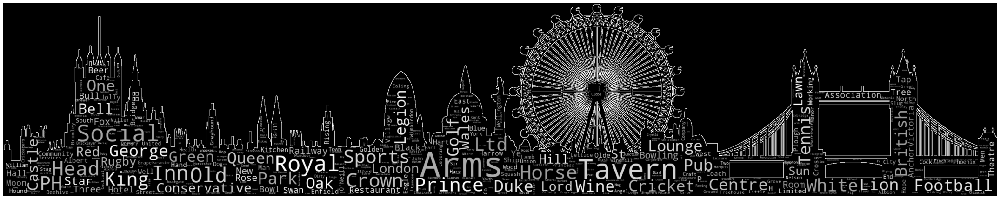

In [241]:
# Convert pub names column to string
London_Pub_Names_df['Pub_Name'] = London_Pub_Names_df['Pub_Name'].astype(str)

# Custom Colour Function
def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

# Define text for the wordclou (a string made up of the pub names column)
text = ' '.join(review for review in London_Pub_Names_df.Pub_Name)  

# Define stop words (words that won't be included)
stopwords = ["Public House", "Public", "House", "Club", "Bar"] + list(STOPWORDS)

# Define shape of word cloud (based on a free image from the internet)
mask = np.array(Image.open(r"C:\Users\richard.dudbridge\Documents\Python Scripts\26.png"))

# Create word cloud
wc = WordCloud(random_state=1, contour_width=0.1, contour_color='white', collocations=False, stopwords = stopwords, background_color='black', mask=mask, mode='RGB', 
              width=100, max_words=500, height=100
              ).generate(text)

# Plot word cloud 
plt.figure(figsize=(30, 60))
plt.imshow(wc.recolor(color_func=grey_color_func, random_state=3), 
            interpolation="bilinear")
plt.tight_layout(pad=0)
plt.axis('off')
plt.show()


# Unused Code

# Code for plotting all maps on sample plot. 

%matplotlib inline 

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(12, 16))

ax1 = merged.plot(ax=ax1,cmap='Blues', linewidth=2,edgecolor='black')
merged.plot(ax=ax1, column='Pubs per square km', cmap='Blues', linewidth=0.1, edgecolor='white')
ax1.set_axis_off()
ax1.set_title('Pub Density', fontsize=20, fontweight='bold')\

ax2 = merged.plot(ax=ax2,cmap='Blues', linewidth=2,edgecolor='black')
merged.plot(ax=ax1, column='Business_survival_rate', cmap='Blues', linewidth=0.1, edgecolor='white')
ax2.set_axis_off()
ax2.set_title('Business Surival Rate', fontsize=20, fontweight='bold')\

ax3 = merged.plot(ax=ax3,cmap='Blues', linewidth=2,edgecolor='black')
merged.plot(ax=ax3, column='Median_income', cmap='Blues', linewidth=0.1, edgecolor='white')
ax3.set_axis_off()
ax3.set_title('Median Household Income', fontsize=20, fontweight='bold')\
# Set choropleth range - people per hectare
vmin3, vmax3 = 28000, 64000
# Colour bar legend
sm3= plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin3, vmax=vmax3))
sm3._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm3)


# Population Density Plot
ax4 = merged.plot(ax=ax4,cmap='Blues', linewidth=2,edgecolor='black')
merged.plot(ax=ax4, column='Population_density', cmap='Blues', linewidth=0.1, edgecolor='white')
ax4.set_axis_off()
ax4.set_title('Population Density', fontsize=20, fontweight='bold')\
# Set choropleth range - people per hectare
vmin4, vmax4 = 20, 160
# Colour bar legend
sm4 = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin4, vmax=vmax4))
sm4._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm4)


plt.show()



# Code for creating a London map with Borough dots 

# create map of London using latitude and longitude values
map_London = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(df_centre_points['Latitude'], df_centre_points['Longitude'], df_centre_points['Borough']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_London)  

map_London

# Static Chlorpath map of decision matrix scores

df_pub_score = normalized_decision_matrix_df[['Borough', 'Pub Score Total']]

# Merge df for map and df decision matrix
df_for_map_new = df_for_map.join(df_pub_score.set_index('Borough'), on = 'Borough')

# Join geodf with filtered df csv (using index of the name of borough)
merged_new = map_df.set_index('Borough').join(df_for_map_new.set_index('Borough'))

# Set choropleth range
vmin, vmax = 0, 10

#Create figure and axis for Matplotlib
fig, ax = plt.subplots(1, figsize=(10,6))

# Remove the axis
ax.axis('off')
# Add title
ax.set_title('Pub Score Total', fontdict={'fontsize':'25', 'fontweight' : '3'})
# Colour bar legend
sm = plt.cm.ScalarMappable(cmap = 'Blues',
                          norm = plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)

# Plot map
merged_new.plot(column='Pub Score Total', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

# Prints top 5 venues for each Borough
num_top_venues = 5

for hood in London_grouped['Borough']:
    print("----"+hood+"----")
    temp = London_grouped[London_grouped['Borough'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')
    
    def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

## Centre Point Data 

# This section covers scraping the wiki table "https://en.wikipedia.org/wiki/List_of_London_boroughs" for Borough coordinates.

# Wiki page object
response = requests.get("https://en.wikipedia.org/wiki/List_of_London_boroughs")

# BeautifulSoup object using wiki url and specifying the HTML encoding is BOM (byte order mark)
data = response.text
soup = BeautifulSoup(data)

# Instance of Beautiful Soup used for parsing wiki page
soup = BeautifulSoup(response.text, 'html.parser')

# Table object (wikitable sortable is the id of the table found in the HTML)
table = soup.find('table',{'class':'wikitable sortable'})

# Create dataframe of table
df_centre_points = pd.read_html(str(table))
df_centre_points = df_centre_points[0]

# Split coordinates by '/'
df_centre_points[['X Coord', 'Correct Co-ordinates']] = df_centre_points['Co-ordinates'].str.split('/', expand = True)

# Split coordinates by latitude and longitude
df_centre_points[['Latitude','Longitude']] = df_centre_points['Correct Co-ordinates'].str.split(expand = True)

# Remove coordinate symbols
df_centre_points['Latitude'] = df_centre_points['Latitude'].str.rstrip('N°')
df_centre_points['Longitude'] = df_centre_points['Longitude'].str.rstrip('E°')
df_centre_points['Longitude'] = df_centre_points['Longitude'].str.rstrip('W°')

# Add minus symbol to Longitude
df_centre_points['Longitude'] = df_centre_points['Longitude'].apply(lambda x: "{}{}".format('-', x))

# Drop useless columns
df_centre_points.drop(['Correct Co-ordinates', 'Co-ordinates', 'X Coord','Inner','Status', 'Headquarters', 'Area (sq mi)', 'Nr. in map'], axis=1, inplace = True)

# Remove encoding prefix
#df_centre_points['Latitude'] = df['Latitude'].map(lambda x: x.lstrip('\ufeff').rstrip(''))
df_centre_points['Latitude'] = df_centre_points['Latitude'].astype(str).str.replace('\ufeff', '')

# Convert Longitude and Latitude from string to float
df_centre_points['Longitude'] = pd.to_numeric(df_centre_points['Longitude'])
df_centre_points['Latitude'] = pd.to_numeric(df_centre_points['Latitude'])

# Get centre points for London
address = 'London'
# Nominatim allows addresses to be converted into coordinates
geolocator = Nominatim(user_agent="London_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

df_centre_points.head(33)